In [1]:
# General modules
import sys
import os
import session_info
import warnings
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Specific modules
import scanpy as sc
import anndata as ad

# Setting some parameters
warnings.filterwarnings("ignore")

dpi_fig_save = 300
sc.set_figure_params(dpi=100, dpi_save=dpi_fig_save, vector_friendly=True)

**Import functions**

**Parameters**

In [2]:
root_folder =  "/scratch/devel/saguilar/PhD/PROJECTS/tonsil_atlas/TonsilAtlasCAP/"
adata_input_path = root_folder + "results/TonsilAtlasADATA_toCAP.h5ad"

# Load data

In [3]:
adata = sc.read_h5ad(adata_input_path)
adata

AnnData object with n_obs × n_vars = 377988 × 38606
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

# Quality control
Cells were subsetted to those cells utilized in the TonsilAtlas paper

# Normalization

In [4]:
# Keeping 'raw' counts
adata.layers["counts"] = adata.X.copy()

# Normalization, replace adata.X and storing
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.layers["log1p_10e4_counts"] = adata.X.copy()
adata

AnnData object with n_obs × n_vars = 377988 × 38606
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo', 'log1p'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'counts', 'log1p_10e4_counts'

**Visualization**

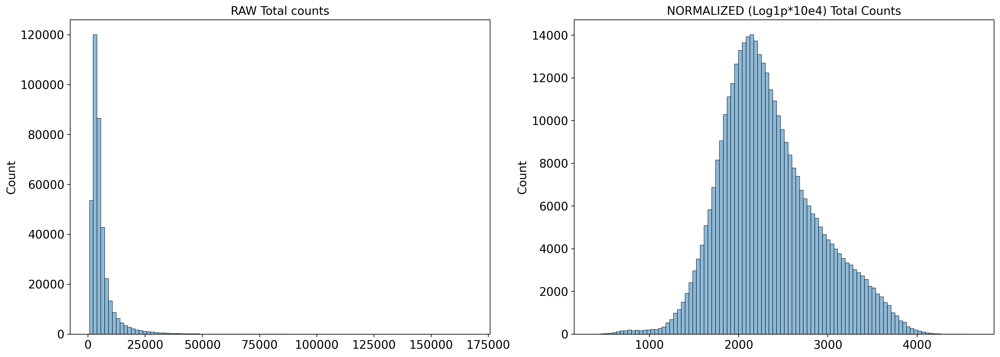

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

p1 = sns.histplot(adata.layers["counts"].sum(1), bins=100, kde=False, ax=axes[0], legend=False)
axes[0].set_title("RAW Total counts")
axes[0].grid(False)

p2 = sns.histplot(adata.layers["log1p_10e4_counts"].sum(1), bins=100, kde=False, ax=axes[1], legend=False)
axes[1].set_title("NORMALIZED (Log1p*10e4) Total Counts")
axes[1].grid(False)
plt.show()

# Feature selection

**Excluding specific genes from HVG selection**

In [6]:
# Retrieve MT and RB genes present in the dataset
MT_gene_idx = adata.var["gene_symbol"].str.startswith("MT-")
print(f"{np.sum(MT_gene_idx)} mitochondrial genes")

RB_gene_idx = adata.var["gene_symbol"].str.startswith(("RPS", "RPL"))
print(f"{np.sum(RB_gene_idx)} ribosomal genes")

# Retrieve TCR and BCR present in the dataset
TCR_gene_idx = adata.var["gene_symbol"].str.contains("^TRA(J|V)|^TRB(J|V|D)")
print(f"{np.sum(TCR_gene_idx)} TCR genes")

BCR_gene_idx = adata.var["gene_symbol"].str.contains("^IGH(J|V)|^IGK(J|V)|^IGL(J|V)")
print(f"{np.sum(BCR_gene_idx)} BCR genes")

exclude_gene_idx = (MT_gene_idx | RB_gene_idx | TCR_gene_idx | BCR_gene_idx)

adata_forHVG = adata[:, ~exclude_gene_idx]
adata_forHVG

13 mitochondrial genes
107 ribosomal genes
198 TCR genes
350 BCR genes


View of AnnData object with n_obs × n_vars = 377988 × 37938
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo', 'log1p'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'counts', 'log1p_10e4_counts'

**Compute HVG**

In [7]:
groupby = 'assay' 
batch_key = 'libraryID'
flavor = 'seurat'
min_number_cells = 5
n_bins=20
n_top_genes=5000

In [8]:
listGroups = adata.obs[groupby].unique()
listGroups

['10x 3' v3']
Categories (1, object): ['10x 3' v3']

In [9]:
HVGdf = pd.DataFrame()
if groupby is not None:
    listGroups = adata.obs[groupby].unique()
    for g in listGroups:
        print(g)
        adata_g = adata_forHVG[adata_forHVG.obs[groupby]==g]
        if adata_g.shape[0] <= min_number_cells:
            print('WARNING: The group {} includes only {} cells. Not considered'.format(g, adata_g.shape[0]))
            continue
        HVGdf_i = sc.pp.highly_variable_genes(adata=adata_g, 
                                batch_key=batch_key, 
                                flavor=flavor, 
                                n_top_genes=n_top_genes, 
                                n_bins=n_bins, inplace=False)

        HVGdf_i = HVGdf_i.add_suffix('_{}'.format(g))
        if batch_key is None:
            HVGdf_i['gene_name'] = adata_g.var_names
            HVGdf_i.set_index('gene_name', inplace=True, drop=True)
            HVGdf_i.index.name = None
        HVGdf = HVGdf.merge(HVGdf_i, how='right', left_index=True, right_index=True)

10x 3' v3


In [10]:
HVGdf

,means_10x 3' v3,dispersions_10x 3' v3,dispersions_norm_10x 3' v3,highly_variable_nbatches_10x 3' v3,highly_variable_intersection_10x 3' v3,highly_variable_10x 3' v3
ENSG00000290825,0.000051,0.190385,-0.023163,1,False,False
ENSG00000243485,0.000015,0.050434,0.032840,2,False,False
ENSG00000237613,0.000000,0.000000,0.000000,0,False,False
ENSG00000290826,0.000000,0.000000,0.000000,0,False,False
ENSG00000186092,0.000004,0.008255,-0.021737,0,False,False
...,...,...,...,...,...,...
ENSG00000277836,0.001009,0.683220,-0.333645,7,False,False
ENSG00000278633,0.000044,0.116138,0.032341,1,False,False
ENSG00000276017,0.000012,-0.033059,-0.175508,1,False,False
ENSG00000278817,0.003076,0.783022,-0.199797,6,False,False


In [11]:
selected_genes = HVGdf.index[HVGdf["highly_variable_10x 3' v3"] == True].tolist()
adata.var["highly_variable"] = False
adata.var.loc[selected_genes, "highly_variable"] = True
adata

AnnData object with n_obs × n_vars = 377988 × 38606
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol', 'highly_variable'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo', 'log1p'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'counts', 'log1p_10e4_counts'

# Integration

In [12]:
import os

import scanpy as sc
import pandas as pd
import numpy as np

import symphonypy as sp

from pyprojroot import here

**Subset to HVG**

In [13]:
adata_HVG = adata[:, adata.var.highly_variable]
adata_HVG

View of AnnData object with n_obs × n_vars = 377988 × 5000
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol', 'highly_variable'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo', 'log1p'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'counts', 'log1p_10e4_counts'

**Scaling**

In [14]:
sc.pp.scale(adata_HVG)

**PCA**

In [15]:
nPC = 30
sc.pp.pca(adata_HVG, 
          n_comps=nPC, 
          use_highly_variable = False,
          zero_center=False)

**Harmony**

In [16]:
batch_key_ref = "10X_channel" #"libraryID"
random_seed = 42
sp.pp.harmony_integrate(adata_HVG,
                        key=batch_key_ref, 
                        verbose = True, 
                        random_seed=random_seed,  
                        **{'max_iter_harmony':100}, # harmony_kwargs | should reach convergence before
                       )

2024-07-26 21:32:44,866 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Harmony integration with harmonypy is preforming.


2024-07-26 21:33:41,141 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-07-26 21:33:45,690 - harmonypy - INFO - Iteration 1 of 100
2024-07-26 21:37:28,229 - harmonypy - INFO - Iteration 2 of 100
2024-07-26 21:41:16,723 - harmonypy - INFO - Iteration 3 of 100
2024-07-26 21:45:07,140 - harmonypy - INFO - Iteration 4 of 100
2024-07-26 21:49:01,269 - harmonypy - INFO - Iteration 5 of 100
2024-07-26 21:53:05,130 - harmonypy - INFO - Iteration 6 of 100
2024-07-26 21:56:55,494 - harmonypy - INFO - Iteration 7 of 100
2024-07-26 22:00:55,749 - harmonypy - INFO - Converged after 7 iterations


In [17]:
adata_HVG

AnnData object with n_obs × n_vars = 377988 × 5000
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol', 'highly_variable', 'mean', 'std'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo', 'log1p', 'pca', 'harmony'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'counts', 'log1p_10e4_counts'

# KNN graph and UMAP from the integrated embedded space

In [18]:
n_pcs = 30
sc.pp.neighbors(adata_HVG, n_neighbors=30, n_pcs=n_pcs, use_rep = 'X_pca_harmony', key_added = 'harmony')

2024-07-26 22:01:28.078579: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-26 22:01:28.930448: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-26 22:01:29.532790: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-26 22:01:42.320940: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT




Failed to import TF-Keras. Please note that TF-Keras is not installed by default when you install TensorFlow Probability. This is so that JAX-only users do not have to install TensorFlow or TF-Keras. To use TensorFlow Probability with TensorFlow, please install the tf-keras or tf-keras-nightly package.
This can be be done through installing the tensorflow-probability[tf] extra.




In [19]:
sc.tl.umap(adata_HVG, neighbors_key='harmony')

In [20]:
adata_HVG

AnnData object with n_obs × n_vars = 377988 × 5000
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol', 'highly_variable', 'mean', 'std'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo', 'log1p', 'pca', 'harmony', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'counts', 'log1p_10e4_counts'
    obsp: 'harmony_distances', 'harmony_connectivities'

# Save processed adata

**Import results to adata**

In [21]:
adata

AnnData object with n_obs × n_vars = 377988 × 38606
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol', 'highly_variable'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo', 'log1p'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'counts', 'log1p_10e4_counts'

In [22]:
adata.uns = adata_HVG.uns.copy()
adata.obsm = adata_HVG.obsm.copy()
adata.obsp = adata_HVG.obsp.copy()
adata.var['highly_variable'] = False
adata.var['highly_variable'][adata.var_names.isin(adata_HVG.var_names)] = True

In [23]:
adata

AnnData object with n_obs × n_vars = 377988 × 38606
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol', 'highly_variable'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo', 'log1p', 'pca', 'harmony', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'X_pca_harmony'
    layers: 'counts', 'log1p_10e4_counts'
    obsp: 'harmony_distances', 'harmony_connectivities'

In [24]:
save_path = root_folder + "results/TonsilAtlasADATA_toCAP_processed.h5ad"
adata.write(save_path, compression="gzip")

# Check Annotations

**Load object**

In [3]:
save_path = root_folder + "results/TonsilAtlasADATA_toCAP_processed.h5ad"

In [4]:
adata = sc.read_h5ad(save_path)
adata

AnnData object with n_obs × n_vars = 377988 × 38606
    obs: 'barcode', 'donor_id', '10X_channel', 'libraryID', 'assay', 'sex', 'age', 'age_group', 'hospital', 'cell_types_level1', 'cell_types_level2', 'cell_types_level3_20230508', 'disease', 'organism', 'tissue'
    var: 'ensembl_id', 'gene_symbol', 'highly_variable'
    uns: 'ArrayExpress', 'Azimuth', 'DOI', 'GitHub', 'HCATonsilData', 'X_layer_explanation', 'Zenodo', 'harmony', 'log1p', 'pca', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts', 'log1p_10e4_counts'
    obsp: 'harmony_connectivities', 'harmony_distances'

In [5]:
# We have a FDC cluster annotated as unknown that is NA for the azimuth annotation
na_mask = adata.obs["cell_types_level2"].isna()
adata.obs["cell_types_level2"] = adata.obs["cell_types_level2"].cat.add_categories(["unknown"])
adata.obs.loc[na_mask, "cell_types_level2"] = "unknown"

**Plot annotation**

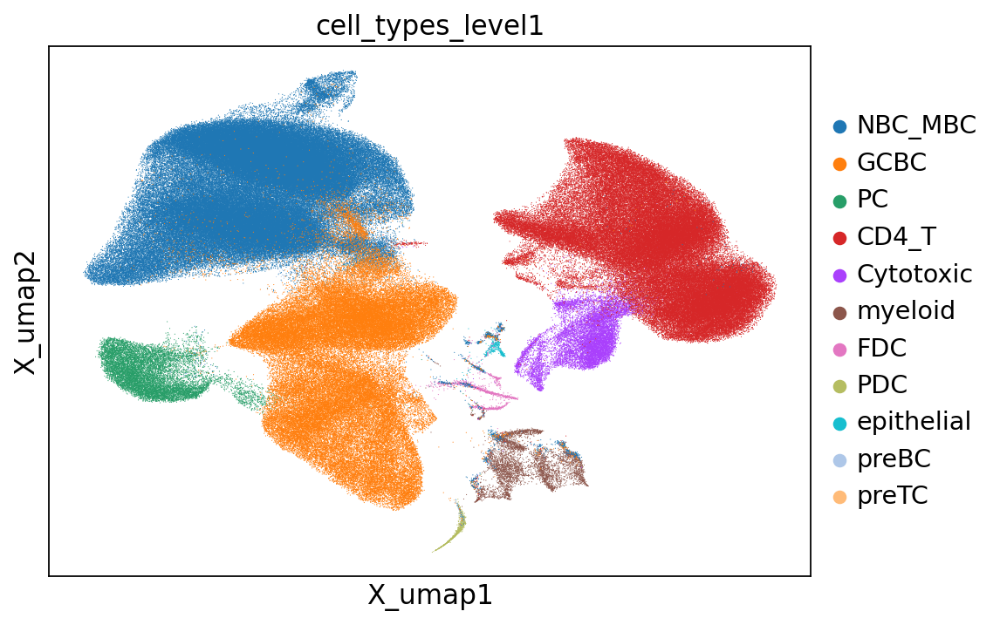

In [27]:
sc.set_figure_params(figsize=(7, 5))
fig = sc.pl.embedding(adata, basis="X_umap", 
                      color=["cell_types_level1"], 
                      use_raw=False, 
                      show=True, 
                      return_fig=True, 
                      size=1)

In [6]:
n = adata.obs["cell_types_level2"].nunique()
colors = plt.cm.get_cmap('tab20', n)
color_palette = [colors(i) for i in range(n)]

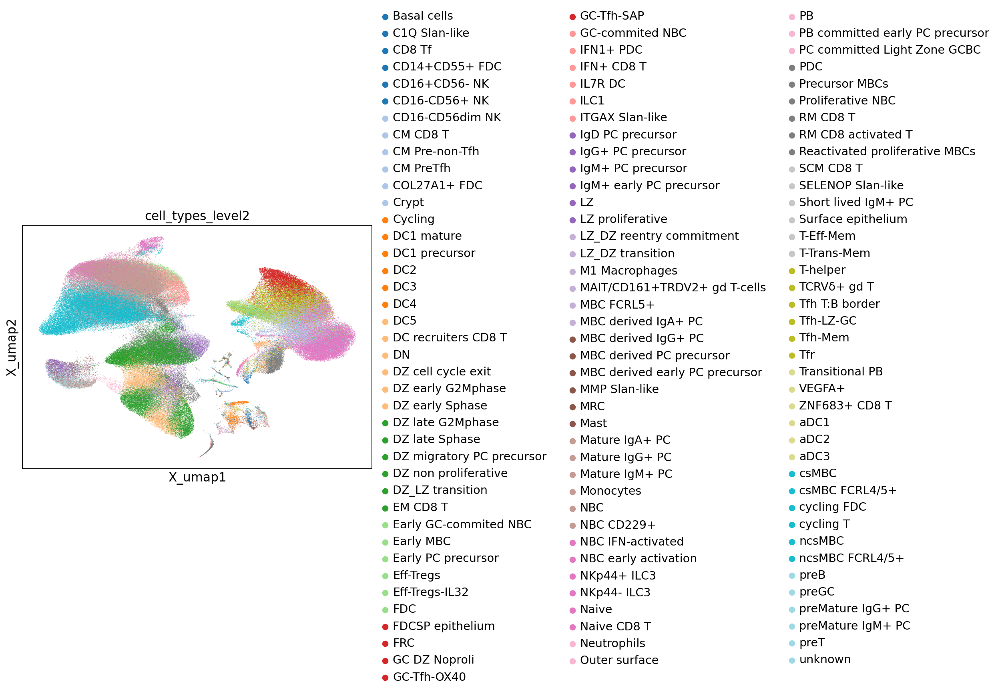

In [7]:
sc.set_figure_params(figsize=(7, 5))
fig = sc.pl.embedding(adata, basis="X_umap", 
                      color=["cell_types_level2"], 
                      use_raw=False, 
                      palette = color_palette,
                      show=True, 
                      return_fig=True, 
                      size=1)

**Covariates**

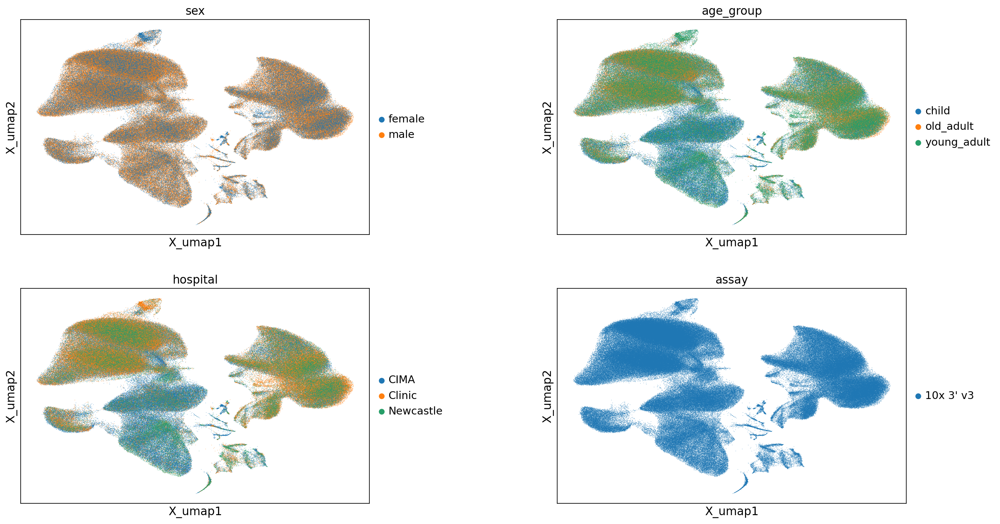

In [38]:
fig = sc.pl.embedding(adata, basis = 'X_umap', 
                 color=['sex','age_group',
                      "hospital", "assay"], 
                      size=1,
                 wspace = 0.4, ncols = 2, return_fig=True)

**Known marker genes**

In [39]:
geneList = ['PTPRC', # immune cells
                        'CD3D', 'CD4', 'CD8A', 'FOXP3', # T cells
                        'NCAM1', 
                        'CD79A', 'MS4A1', 'JCHAIN', 
                        'LYZ', 'CD14', 'FCGR3A', 'PLAC8',
                        'CLEC4C', 
                        'CLEC10A', 'IDO1',
                        'S100A9', 
                        'CD34', 
                        'PPBP' 
           ]

In [40]:
symbols_col = 'gene_symbol'
ID_col = 'index'
symbolList = geneList

In [41]:
varDF = adata.var
gene_namesDF = varDF.loc[varDF[symbols_col].isin(symbolList)]
gene_namesDF[symbols_col] = pd.Categorical( gene_namesDF[symbols_col], categories=symbolList, ordered=True)
if gene_namesDF[symbols_col].duplicated().sum() == 0:
    if ID_col == 'index':
        ID2symDF = gene_namesDF.reset_index(names = 'gene_id')[['gene_id',symbols_col]].sort_values(symbols_col)
    else:
        ID2symDF = gene_namesDF[[ID_col,symbols_col]].sort_values(symbols_col)

In [42]:
ID2symDF.head()

,gene_id,gene_symbol
2,ENSG00000081237,PTPRC
12,ENSG00000167286,CD3D
13,ENSG00000010610,CD4
4,ENSG00000153563,CD8A
18,ENSG00000049768,FOXP3


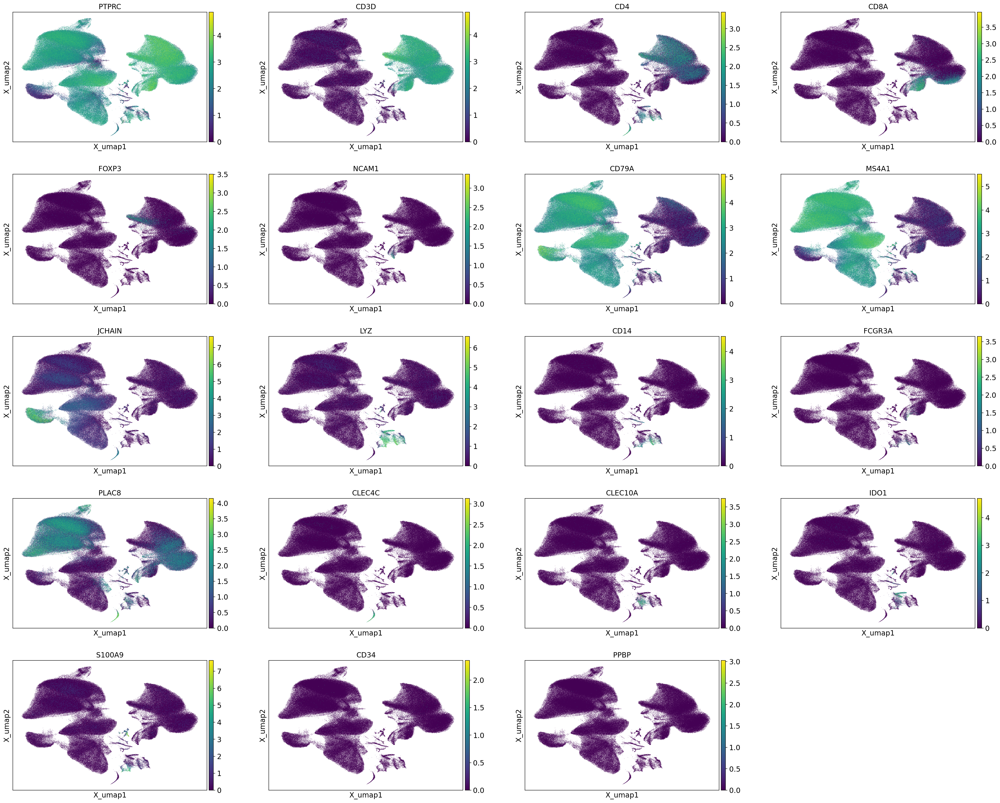

In [47]:
fig = sc.pl.embedding(adata, basis = 'X_umap', 
                 color= ID2symDF.gene_id.tolist(), title = ID2symDF.gene_symbol.tolist(),
                 size = 1,
                 #vmin=0.01, vmax=0.99,
                 wspace = 0.2, sort_order=True, ncols=4, return_fig=True, use_raw=False)